# MASK R-CNN

In [95]:
import os
import torch
import numpy as np
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from pycocotools.coco import COCO
import torchvision
import torchvision.transforms as transforms
import torchvision.transforms.functional as F
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import matplotlib.pyplot as plt

<p>The CustomTurtleDataset class is a custom PyTorch Dataset designed for working with sea turtle segmentation data in the COCO format. It handles image loading, annotation parsing, and preprocessing, making it suitable for deep learning tasks such as object detection and segmentation. Upon initialization, the class reads the dataset's annotations from a JSON file, mapping category IDs to continuous labels and collecting image IDs. Each dataset entry includes an RGB image and a corresponding target dictionary containing bounding boxes, labels, and binary masks for annotated objects. The images and masks are resized to 512 x 512, ensuring uniform input dimensions.</p>

In [92]:
class CustomTurtleDataset(Dataset):
    def __init__(self, root, transforms=None, target_size=(512, 512)):
        self.root = root
        self.transforms = transforms
        self.target_size = target_size

        ann_file = os.path.join(root, "annotations.json")
        if not os.path.exists(ann_file):
            raise FileNotFoundError(f"Annotations file not found at {ann_file}")

        self.coco = COCO(ann_file)

        self.categories = self.coco.loadCats(self.coco.getCatIds())
        print("Categories found:", [cat["name"] for cat in self.categories])

        self.cat_id_to_continuous_id = {
            cat_id: idx + 1 for idx, cat_id in enumerate(self.coco.getCatIds())
        }
        print("Category mapping:", self.cat_id_to_continuous_id)

        self.img_ids = list(self.coco.imgs.keys())

        if len(self.img_ids) == 0:
            raise ValueError("No images found in the dataset")

        print(f"Found {len(self.img_ids)} images in the dataset")

    def __getitem__(self, idx):
        if idx >= len(self):
            raise IndexError(
                f"Index {idx} out of range for dataset of size {len(self)}"
            )

        img_id = self.img_ids[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        img_path = os.path.join(self.root, img_info["file_name"])

        if not os.path.exists(img_path):
            raise FileNotFoundError(f"Image file {img_path} not found")

        img = Image.open(img_path).convert("RGB")

        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)

        if not anns:
            mask = torch.zeros(
                (1, img_info["height"], img_info["width"]), dtype=torch.uint8
            )
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros(0, dtype=torch.int64)
        else:
            mask = torch.zeros(
                (len(anns), img_info["height"], img_info["width"]), dtype=torch.uint8
            )
            boxes = []
            labels = []

            for i, ann in enumerate(anns):
                current_mask = self.coco.annToMask(ann)
                mask[i] = torch.tensor(current_mask, dtype=torch.uint8)

                bbox = ann["bbox"]  
                boxes.append([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]])

                category_id = ann["category_id"]
                continuous_id = self.cat_id_to_continuous_id[category_id]
                labels.append(continuous_id)

            boxes = torch.tensor(boxes, dtype=torch.float32)
            labels = torch.tensor(labels, dtype=torch.int64)

        img = F.resize(img, self.target_size)
        if mask.shape[0] > 0: 
            mask = F.resize(mask, self.target_size)

        if self.transforms is not None:
            img = self.transforms(img)
        else:
            img = F.to_tensor(img)

        target = {"boxes": boxes, "labels": labels, "masks": mask}

        return img, target

    def __len__(self):
        return len(self.img_ids)

<p>The dataset is wrapped in the CustomTurtleDataset class, which loads images, annotations, and applies transformations like normalization. The model, a pretrained Mask R-CNN with a ResNet-50 backbone, is modified to match the number of classes in the dataset by replacing its prediction heads (FastRCNNPredictor for boxes and MaskRCNNPredictor for masks).</p>

In [75]:
def collate_fn(batch):
    return tuple(zip(*batch))


def train_model(data_root, num_epochs=10, batch_size=2):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    transform = transforms.Compose(
        [
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ]
    )

    try:
        dataset = CustomTurtleDataset(data_root, transforms=transform)

        num_classes = len(dataset.cat_id_to_continuous_id) + 1
        print(f"Training with {num_classes} classes (including background)")

        data_loader = DataLoader(
            dataset,
            batch_size=batch_size,
            shuffle=True,
            num_workers=0,
            collate_fn=collate_fn,
        )
    except Exception as e:
        print(f"Error initializing dataset: {str(e)}")
        return

    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    model.roi_heads.mask_predictor = MaskRCNNPredictor(
        in_features_mask, 256, num_classes
    )

    model.to(device)

    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

    print("Starting training...")
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        num_batches = 0

        for batch_idx, (images, targets) in enumerate(data_loader):
            try:
                images = [img.to(device) for img in images]
                targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

                loss_dict = model(images, targets)
                losses = sum(loss for loss in loss_dict.values())

                print(f"Batch {batch_idx+1}, Losses: {loss_dict}")

                if not torch.isfinite(losses):
                    print(f"Non-finite loss detected in Batch {batch_idx+1}: {losses}")
                    continue

                optimizer.zero_grad()
                losses.backward()

                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

                optimizer.step()

                running_loss += losses.item()
                num_batches += 1

            except RuntimeError as e:
                print(f"Error in batch {batch_idx+1}: {str(e)}")
                continue

        epoch_loss = running_loss / num_batches if num_batches > 0 else float("inf")
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

    print("Training completed!")
    return model

if __name__ == "__main__":
    data_root = "turtles-data/data"

    try:
        trained_model = train_model(data_root)

        torch.save(trained_model.state_dict(), "turtle_segmentation_model.pth")
        print("Model saved successfully!")

    except Exception as e:
        print(f"An error occurred: {str(e)}")

Using device: cpu
loading annotations into memory...
Done (t=10.41s)
creating index...
index created!
Categories found: ['turtle', 'flipper', 'head']
Category mapping: {1: 1, 2: 2, 3: 3}
Found 8729 images in the dataset
Training with 4 classes (including background)
Starting training...
Batch 1, Losses: {'loss_classifier': tensor(2.0131, grad_fn=<NllLossBackward0>), 'loss_box_reg': tensor(0.0001, grad_fn=<DivBackward0>), 'loss_mask': tensor(0.8052, grad_fn=<BinaryCrossEntropyWithLogitsBackward0>), 'loss_objectness': tensor(8.9263, grad_fn=<BinaryCrossEntropyWithLogitsBackward0>), 'loss_rpn_box_reg': tensor(48.9756, grad_fn=<DivBackward0>)}
Batch 2, Losses: {'loss_classifier': tensor(2.0973, grad_fn=<NllLossBackward0>), 'loss_box_reg': tensor(0.0003, grad_fn=<DivBackward0>), 'loss_mask': tensor(0.8470, grad_fn=<BinaryCrossEntropyWithLogitsBackward0>), 'loss_objectness': tensor(9.3419, grad_fn=<BinaryCrossEntropyWithLogitsBackward0>), 'loss_rpn_box_reg': tensor(63.7756, grad_fn=<DivBackw

KeyboardInterrupt: 

<p><b>Due to the high training times (~ 20 hours per epoch), I interrupted the kernel after 7 epochs and saved the weights. Also, the loss was plateauing.</b></p>

In [77]:
model.load_state_dict(torch.load("turtle_segmentation_model_epoch_7.pth"))
model.eval()  

/var/folders/4y/9y5ld1xn3zn_rhkhdmmr63zr0000gn/T/ipykernel_46474/2241268845.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("turtle_segm

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [85]:
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=False)

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, 3)

in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask, 256, 3)

model.load_state_dict(torch.load("turtle_segmentation_model_epoch_7.pth"))
model.eval().to(device)

/var/folders/4y/9y5ld1xn3zn_rhkhdmmr63zr0000gn/T/ipykernel_46474/3335918867.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("turtle_seg

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu):

In [86]:
test_loader = DataLoader(
    test_dataset, 
    batch_size=1,  
    shuffle=False, 
    num_workers=0,
    collate_fn=collate_fn,
)

<P>The class_names list is defined to map the model's output categories to their corresponding labels: background, head, flippers, and turtle. The model is switched to evaluation mode using model.eval().

The code then iterates over the test dataset using test_loader, processing a specified number of images (num_images_to_show) to display predictions. For each image in the batch, predictions are made within a torch.no_grad() context to avoid unnecessary gradient computations.</P>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6897851..2.64].


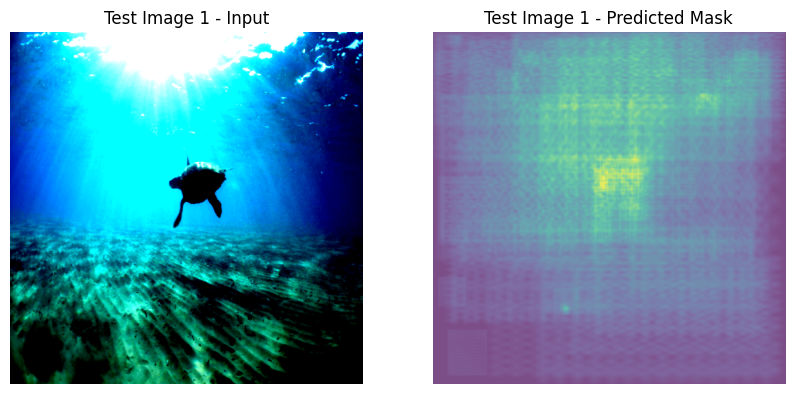

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9637812..2.4134207].


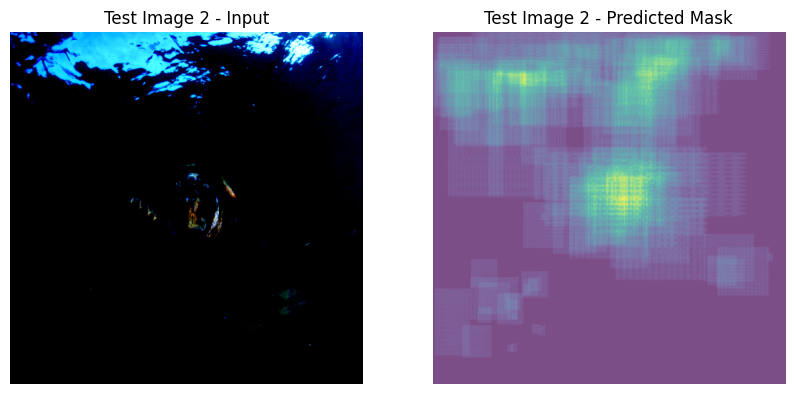

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6555357..1.4896734].


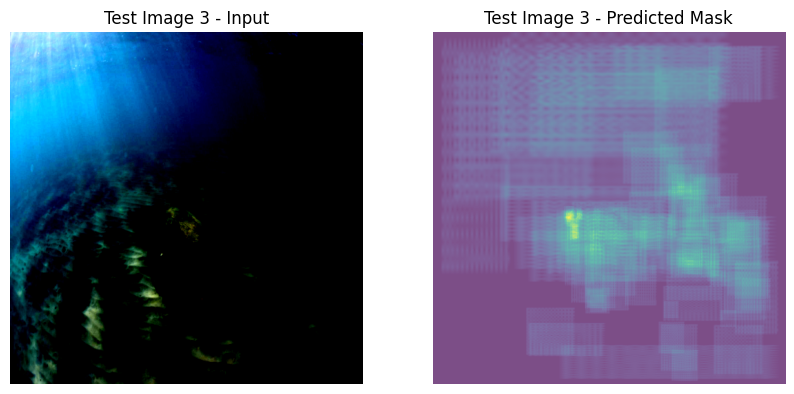

In [88]:
class_names = ["background", "head", "flippers", "turtle"]

model.eval() 

num_images_to_show = 3
for idx, (images, targets) in enumerate(test_loader):
    if idx >= num_images_to_show:
        break

    images = [img.to(device) for img in images]

    with torch.no_grad():
        predictions = model(images)

    img = images[0].cpu().permute(1, 2, 0).numpy()  
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title(f"Test Image {idx + 1} - Input")
    plt.axis("off")

    pred_masks = predictions[0]["masks"].cpu().numpy()
    combined_mask = np.zeros_like(img[:, :, 0], dtype=np.float32)

    for i, mask in enumerate(pred_masks):
        combined_mask += mask[0]  

    plt.subplot(1, 2, 2)
    plt.imshow(combined_mask, cmap="viridis", alpha=0.7) 
    plt.title(f"Test Image {idx + 1} - Predicted Mask")
    plt.axis("off")

    plt.show()

<p>The code below computes the mean IoU scores for each class.</p>

In [89]:
def compute_iou(pred_mask, target_mask):
    intersection = (pred_mask & target_mask).sum()
    union = (pred_mask | target_mask).sum()
    return intersection / union if union != 0 else 0


ious = {"head": [], "flippers": [], "turtle": []}

model.eval()  

for idx, (images, targets) in enumerate(test_loader):
    images = [img.to(device) for img in images]

    with torch.no_grad():
        predictions = model(images)

    pred_masks = (
        (predictions[0]["masks"] > 0.5).cpu().numpy()
    )  
    gt_masks = targets[0]["masks"].cpu().numpy()

    for i, label in enumerate(targets[0]["labels"]):
        class_name = class_names[label.item()] 
        pred_mask = pred_masks[i][0]
        gt_mask = gt_masks[i]

        iou = compute_iou(pred_mask, gt_mask)
        ious[class_name].append(iou)

mean_ious = {cls: np.mean(scores) if scores else 0 for cls, scores in ious.items()}

for cls, mean_iou in mean_ious.items():
    print(f"Mean IoU for {cls}: {mean_iou:.4f}")

Mean IoU for head: 0.0423
Mean IoU for flippers: 0.0121
Mean IoU for turtle: 0.0293


<p>Mask R-CNN has a complex architecture and is very time intensive. Due to time constraints, I could not fine-tune this model. Moving on, it may be better to use lightweight versions of Mask R-CNN. Another solution could be training it on a smaller subset of the dataset initially. </p>